In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

Recebendo inputs do kaggle e separando em pastas

In [2]:
import os

# Caminhos para as pastas
train_color_dir = "/kaggle/working/train_color"
train_gray_dir = "/kaggle/working/train_gray"
val_color_dir = "/kaggle/working/val_color"
val_gray_dir = "/kaggle/working/val_gray"

# Função para criar pastas, se elas não existirem
def create_folders():
    os.makedirs(train_color_dir, exist_ok=True)
    os.makedirs(train_gray_dir, exist_ok=True)
    os.makedirs(val_color_dir, exist_ok=True)
    os.makedirs(val_gray_dir, exist_ok=True)

# Criar pastas
create_folders()

print("Pastas criadas com sucesso!")


Pastas criadas com sucesso!


In [3]:
import os
import shutil
from sklearn.model_selection import train_test_split

# Caminhos para as pastas
color_dir = "/kaggle/input/landscape-image-colorization/landscape Images/color"
gray_dir = "/kaggle/input/landscape-image-colorization/landscape Images/gray"
train_color_dir = "/kaggle/working/train_color"
train_gray_dir = "/kaggle/working/train_gray"
val_color_dir = "/kaggle/working/val_color"
val_gray_dir = "/kaggle/working/val_gray"

# Listar imagens (assumindo que os pares têm o mesmo nome de arquivo)
color_images = sorted(os.listdir(color_dir))
gray_images = sorted(os.listdir(gray_dir))

# Extraindo nomes dos arquivos (sem a extensão)
image_names = [os.path.splitext(img)[0] for img in color_images]

# Dividir em treino e validação (usando 20% para validação, por exemplo)
train_names, val_names = train_test_split(image_names, test_size=0.2, random_state=42)

# Função para mover arquivos
def copy_images(image_names, src_color_dir, src_gray_dir, dst_color_dir, dst_gray_dir):
    for name in image_names:
        shutil.copy(os.path.join(src_color_dir, f"{name}.jpg"), os.path.join(dst_color_dir, f"{name}.jpg"))
        shutil.copy(os.path.join(src_gray_dir, f"{name}.jpg"), os.path.join(dst_gray_dir, f"{name}.jpg"))

# Mover os arquivos
copy_images(train_names, color_dir, gray_dir, train_color_dir, train_gray_dir)
copy_images(val_names, color_dir, gray_dir, val_color_dir, val_gray_dir)

print("Imagens copiadas com sucesso!")


Imagens copiadas com sucesso!


Importando dependências

In [4]:
# Importe pacotes

import os
import cv2
import numpy as np
import pandas as pd
from PIL import Image
import torch
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import random
import shutil

Preparando imagens

In [5]:
from torchvision import transforms
from torch.utils.data import DataLoader, Dataset
from PIL import Image

# Definindo transformações para as imagens
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Redimensiona as imagens para um tamanho fixo
    transforms.ToTensor()  # Converte as imagens para tensores
])

# Classe customizada para carregar as imagens
class CustomDataset(Dataset):
    def __init__(self, gray_dir, color_dir, image_names, transform=None):
        self.gray_dir = gray_dir
        self.color_dir = color_dir
        self.image_names = image_names
        self.transform = transform

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        gray_image_path = os.path.join(self.gray_dir, f"{self.image_names[idx]}.jpg")
        color_image_path = os.path.join(self.color_dir, f"{self.image_names[idx]}.jpg")

        gray_image = Image.open(gray_image_path).convert("L")
        color_image = Image.open(color_image_path).convert("RGB")

        if self.transform:
            gray_image = self.transform(gray_image)
            color_image = self.transform(color_image)

        return gray_image, color_image

# Criando datasets
train_dataset = CustomDataset(train_gray_dir, train_color_dir, train_names, transform=transform)
val_dataset = CustomDataset(val_gray_dir, val_color_dir, val_names, transform=transform)

# Criando DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=True, num_workers=4, pin_memory=True)

print("DataLoaders criados com sucesso!")

DataLoaders criados com sucesso!


Definindo Gerador

In [45]:
# U-Net

import torch
import torch.nn as nn
import torch.nn.functional as F

class UNet(nn.Module):
    def __init__(self, image_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1):
        super(UNet, self).__init__()

        self.image_dim = image_dim  # Dimensões da imagem de entrada (C, H, W)
        self.depth = depth 
        self.n_channels = n_channels
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.conv_padding = conv_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.pool_padding = pool_padding
        self.transpose_kernel_size = transpose_kernel_size
        self.transpose_stride = transpose_stride
        self.transpose_padding = transpose_padding
        
        # To RGB
        self.to_rgb = nn.Conv2d(1, 3, kernel_size=1)

        # Encoder
        self.encoders = nn.ModuleList([self.conv_block(3 if i == 0 else self.n_channels * (2 ** (i-1)), self.n_channels * (2 ** i)) for i in range(self.depth)])
        self.pool = nn.MaxPool2d(kernel_size=self.pool_kernel_size, stride=self.pool_stride, padding=self.pool_padding)

        # Bottleneck
        self.bottleneck = self.conv_block(self.n_channels * (2 ** (self.depth-1)), self.n_channels * (2 ** self.depth))

        # Decoder
        self.decoders = nn.ModuleList([self.conv_transpose(self.n_channels * (2 ** (i+2)), self.n_channels * (2 ** i)) for i in range(self.depth-2, -1, -1)])

        # Final conv layer
        self.final_conv = nn.Conv2d(self.n_channels, 3, kernel_size=1)

    def conv_block(self, in_channels, out_channels):
        # Camada convolucional com normalização e função de ativação; 2 vezes
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=self.conv_kernel_size, stride=self.conv_stride, padding=self.conv_padding),
            nn.BatchNorm2d(out_channels),  # Normalização para acelerar o treinamento
            nn.ReLU(inplace=True),  # Função de ativação (zera os valores negativos)
            nn.Conv2d(out_channels, out_channels, kernel_size=self.conv_kernel_size, stride=self.conv_stride, padding=self.conv_padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def crop(self, encoder_feature, decoder_feature):
        _, _, h, w = decoder_feature.size()
        encoder_feature = F.interpolate(encoder_feature, size=(h, w), mode='bilinear', align_corners=False)  # Redimensiona a feature map do encoder
        return encoder_feature

    def conv_transpose(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=self.transpose_kernel_size, stride=self.transpose_stride, padding=self.transpose_padding),
            self.conv_block(out_channels, out_channels)
        )
    
    def forward(self, x):
        #print(f"Input shape: {x.shape}")
        encoders_features = []

        # RGB pass
        x = self.to_rgb(x)
        #print(f"After RGB pass: {x.shape}")

        # Encoder pass
        for idx, encoder in enumerate(self.encoders):
            #print("idx: ", idx)
            #print("encoder: ", encoder)
            x = encoder(x)
            encoders_features.append(x)
            #print(f"After encoder block {idx+1}: {x.shape}")
            x = self.pool(x)
            #print(f"After pooling {idx+1}: {x.shape}")

        # Bottleneck
        x = self.bottleneck(x)
        #print(f"After bottleneck: {x.shape}")
        # Doubled the block
        #print("Starting decoder pass")
        # Decoder pass
        for i, decoder in enumerate(self.decoders):
            #print("i: ", i)
            #print("decoder: ", decoder)
            encoder_feature = encoders_features[-(i+1)]
            encoder_feature = self.crop(encoder_feature, x)  # Aplica o crop nas feature maps
            #print(f"Encoder feature {i+1} after crop: {encoder_feature.shape}")

            if i != 0:
                x = torch.cat([encoder_feature, x], dim=1)  # Concatena encoder com decoder
                #print(f"After concatenation with encoder feature {i+1}: {x.shape}")

            x = decoder(x)

        # Final convolution
        x = self.final_conv(x)
        x = F.interpolate(x, size=(self.image_dim[2], self.image_dim[3]), mode='bilinear', align_corners=False)
        #print(f"Output shape after final convolution: {x.shape}")
        
        x = torch.sigmoid(x)
        
        return x

Testando gerador

In [7]:
"""# Obtendo as dimensões das imagens a partir do DataLoader
nex = next(iter(train_loader))
img_dim = nex[0].shape
label_dim = nex[1].shape
print("Img_dim: ", img_dim)
print("Label_dim: ", label_dim)
model = UNet(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)
# Configurando o dispositivo (GPU, se disponível)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")
model = model.to(device)  # Mover o modelo para o dispositivo


# Testando com um batch de dados do DataLoader
for images, labels in train_loader:
    # Move os dados para o dispositivo (GPU/CPU)
    images = images.to(device)
    labels = labels.to(device)
    print("Imagens e rótulos movidos para o dispositivo.")
    print(images.shape)
    print(labels.shape)
    print("Iniciando forward pass...")
    # Passa as imagens pelo modelo U-Net
    output = model(next(iter(train_loader))[0])
    
    # Exibe as dimensões das imagens, labels e da saída do modelo
    print(f"Imagens: {images.shape}")
    print(f"Labels: {labels.shape}")
    print(f"Saída do modelo: {output.shape}")
    
    # Quebrar após o primeiro batch, apenas para teste
    break"""

'# Obtendo as dimensões das imagens a partir do DataLoader\nnex = next(iter(train_loader))\nimg_dim = nex[0].shape\nlabel_dim = nex[1].shape\nprint("Img_dim: ", img_dim)\nprint("Label_dim: ", label_dim)\nmodel = UNet(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)\n# Configurando o dispositivo (GPU, se disponível)\ndevice = torch.device(\'cuda\' if torch.cuda.is_available() else \'cpu\')\nprint(f"Dispositivo: {device}")\nmodel = model.to(device)  # Mover o modelo para o dispositivo\n\n\n# Testando com um batch de dados do DataLoader\nfor images, labels in train_loader:\n    # Move os dados para o dispositivo (GPU/CPU)\n    images = images.to(device)\n    labels = labels.to(device)\n    print("Imagens e rótulos movidos para o dispositivo.")\n    print(images.shape)\n    print(labels.shape)\n    print("Iniciando forward pass...

Gerador gera uma imagem do tamanho desejado, passando pela unet

Discriminador

In [14]:

class Discriminator(nn.Module):
    def __init__(self, image_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1):
        super().__init__()

        self.image_dim = image_dim  # Dimensões da imagem de entrada (C, H, W)
        self.depth = depth 
        self.n_channels = n_channels
        self.conv_kernel_size = conv_kernel_size
        self.conv_stride = conv_stride
        self.conv_padding = conv_padding
        self.pool_kernel_size = pool_kernel_size
        self.pool_stride = pool_stride
        self.pool_padding = pool_padding
        self.transpose_kernel_size = transpose_kernel_size
        self.transpose_stride = transpose_stride
        self.transpose_padding = transpose_padding

        # Encoder
        self.encoders = nn.ModuleList([self.conv_block(3 if i == 0 else self.n_channels * (2 ** (i-1)), self.n_channels * (2 ** i)) for i in range(self.depth)])
        self.pool = nn.MaxPool2d(kernel_size=self.pool_kernel_size, stride=self.pool_stride, padding=self.pool_padding)

        # Bottleneck
        self.bottleneck = self.conv_block(self.n_channels * (2 ** (self.depth-1)), self.n_channels * (2 ** self.depth))

        # Final conv layer
        self.final_conv = nn.Conv2d(self.n_channels * (2 ** self.depth), 1, kernel_size=1)

        # Fully connected layer to reduce the dimensions to [32, 1, 1, 1]
        self.fc = nn.Linear(self.image_dim[2] * self.image_dim[3], 1)

    def conv_block(self, in_channels, out_channels):
        # Camada convolucional com normalização e função de ativação; 2 vezes
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=self.conv_kernel_size, stride=self.conv_stride, padding=self.conv_padding),
            nn.BatchNorm2d(out_channels),  # Normalização para acelerar o treinamento
            nn.ReLU(inplace=True)  # Função de ativação (zera os valores negativos)
        )
    
        """
            nn.Conv2d(out_channels, out_channels, kernel_size=self.conv_kernel_size, stride=self.conv_stride, padding=self.conv_padding),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        """

    def crop(self, encoder_feature, decoder_feature):
        _, _, h, w = decoder_feature.size()
        encoder_feature = F.interpolate(encoder_feature, size=(h, w), mode='bilinear', align_corners=False)  # Redimensiona a feature map do encoder
        return encoder_feature

    def conv_transpose(self, in_channels, out_channels):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size=self.transpose_kernel_size, stride=self.transpose_stride, padding=self.transpose_padding),
            self.conv_block(out_channels, out_channels)
        )
    
    def forward(self, x):
        #print(f"Input shape: {x.shape}")
        encoders_features = []

        # Encoder pass
        for idx, encoder in enumerate(self.encoders):
            #print("idx: ", idx)
            #print("encoder: ", encoder)
            x = encoder(x)
            encoders_features.append(x)
            #print(f"After encoder block {idx+1}: {x.shape}")
            x = self.pool(x)
            #print(f"After pooling {idx+1}: {x.shape}")

        # Bottleneck
        x = self.bottleneck(x)
        #print(f"After bottleneck: {x.shape}")
        # Doubled the block
        #print("Starting decoder pass")

        # Final convolution
        x = self.final_conv(x)
        x = F.interpolate(x, size=(1, 1), mode='bilinear', align_corners=False)
        #print(f"Output shape after final convolution: {x.shape}")
        x = torch.sigmoid(x)


        return x

In [9]:
"""# Obtendo as dimensões das imagens a partir do DataLoader
nex = next(iter(train_loader))
img_dim = nex[0].shape
label_dim = nex[1].shape
print("Img_dim: ", img_dim)
print("Label_dim: ", label_dim)
disc = Discriminator(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)
# Configurando o dispositivo (GPU, se disponível)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")
disc = disc.to(device)  # Mover o modelo para o dispositivo


# Testando com um batch de dados do DataLoader
for images, labels in train_loader:
    # Move os dados para o dispositivo (GPU/CPU)
    images = images.to(device)
    labels = labels.to(device)
    print("Imagens e rótulos movidos para o dispositivo.")
    print(images.shape)
    print(labels.shape)
    print("Iniciando forward pass...")
    # Passa as imagens pelo modelo U-Net
    output = disc(next(iter(train_loader))[1])
    
    # Exibe as dimensões das imagens, labels e da saída do modelo
    print(f"Imagens: {images.shape}")
    print(f"Labels: {labels.shape}")
    print(f"Saída do modelo: ", output.shape)
    
    # Quebrar após o primeiro batch, apenas para teste
    break"""

'# Obtendo as dimensões das imagens a partir do DataLoader\nnex = next(iter(train_loader))\nimg_dim = nex[0].shape\nlabel_dim = nex[1].shape\nprint("Img_dim: ", img_dim)\nprint("Label_dim: ", label_dim)\ndisc = Discriminator(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)\n# Configurando o dispositivo (GPU, se disponível)\ndevice = torch.device(\'cuda\' if torch.cuda.is_available() else \'cpu\')\nprint(f"Dispositivo: {device}")\ndisc = disc.to(device)  # Mover o modelo para o dispositivo\n\n\n# Testando com um batch de dados do DataLoader\nfor images, labels in train_loader:\n    # Move os dados para o dispositivo (GPU/CPU)\n    images = images.to(device)\n    labels = labels.to(device)\n    print("Imagens e rótulos movidos para o dispositivo.")\n    print(images.shape)\n    print(labels.shape)\n    print("Iniciando forward p

Treino

In [15]:
from torch.optim import Adam
from torch.nn import BCELoss, L1Loss, MSELoss
import time

# Loss para o discriminador
d_loss = BCELoss()

class GeneratorLoss(nn.Module):
    def __init__(self, lambda_l1=100):
        super(GeneratorLoss, self).__init__()
        # Definir a perda BCE (usada para a parte adversária)
        self.adversarial_loss = nn.MSELoss()
        # Definir a perda L1
        self.l1_loss = nn.L1Loss()
        # Peso da perda L1
        self.lambda_l1 = lambda_l1

    def forward(self, yhat_fake, fake_images, real_images):
        """
        Parâmetros:
        - yhat_fake: As previsões do discriminador sobre as imagens geradas (fake)
        - fake_images: Imagens geradas pelo gerador
        - real_images: Imagens reais de referência
        
        Retorna:
        - A perda total combinando perda adversária e L1
        """
        # Perda adversária: tentar fazer o discriminador acreditar que as imagens geradas são reais
        adversarial_loss = self.adversarial_loss(yhat_fake, torch.ones_like(yhat_fake))
        
        # Perda L1: minimizar a diferença entre as imagens geradas e as reais
        l1_loss = self.l1_loss(fake_images, real_images)
        
        # Perda total: adversária + ponderação da perda L1
        total_loss = adversarial_loss + self.lambda_l1 * l1_loss
        
        return total_loss

g_loss = GeneratorLoss()
#g_loss = CycleGANLoss()

# Normalize the input values to be between 0 and 1
def normalize(tensor):
    return (tensor - tensor.min()) / (tensor.max() - tensor.min())


In [16]:
class PaisagemGAN(nn.Module):
    def __init__(self, generator, discriminator):
        super(PaisagemGAN, self).__init__()
        self.generator = generator
        self.discriminator = discriminator
        self.global_step = 0

    def compile(self, g_loss, d_loss):
        self.g_loss = g_loss
        self.d_loss = d_loss
        self.g_opt = Adam(self.generator.parameters(), lr=0.0002, betas=(0.5, 0.999))
        self.d_opt = Adam(self.discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))

    def train_step(self, real_images, grey_images):
        
        # Train the discriminator
        #inicio = time.time()
        self.d_opt.zero_grad()
        
        fake_images = self.generator(grey_images)
        yhat_real = self.discriminator(real_images)
        yhat_fake = self.discriminator(fake_images)
        
        # Suavização de rótulos para imagens reais (usando 0.9 ao invés de 1.0)
        d_loss_real = self.d_loss(yhat_real, torch.full_like(yhat_real, 0.9))
        # Suavização opcional de rótulos para imagens falsas (usando 0.1 ao invés de 0.0)
        d_loss_fake = self.d_loss(yhat_fake, torch.full_like(yhat_fake, 0.1))
        # Soma das perdas
        total_d_loss = d_loss_real + d_loss_fake
        total_d_loss.backward()
        
        # Update discriminator weights every 5 steps
        if self.global_step % 5 == 0:
            self.d_opt.step()
        
        self.global_step += 1
        #fim = time.time()
        #print(fim - inicio)

        # Train the generator
        #inicio = time.time()
        self.g_opt.zero_grad()
        
        fake_images = self.generator(grey_images)
        yhat_fake = self.discriminator(fake_images)
        total_g_loss = self.g_loss(yhat_fake, fake_images, real_images)
        
        total_g_loss.backward()
        self.g_opt.step()
        #fim = time.time()
        #print(fim - inicio)
        
        return {'d_loss': total_d_loss.item(), 'g_loss': total_g_loss.item(), 'gen': fake_images}

Realizar treinamento

In [17]:
nex = next(iter(train_loader))
img_dim = nex[0].shape

gene = UNet(image_dim=img_dim, n_channels=64, depth=5, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)
# Configurando o dispositivo (GPU, se disponível)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")
gene = gene.to(device)  # Mover o modelo para o dispositivo

disc = Discriminator(image_dim=img_dim, n_channels=64, depth=3, conv_kernel_size=3, conv_stride=1, conv_padding=1, pool_kernel_size=2, pool_stride=2, pool_padding=0, transpose_kernel_size=3, transpose_stride=2, transpose_padding=1)
# Configurando o dispositivo (GPU, se disponível)
#device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Dispositivo: {device}")
disc = disc.to(device)  # Mover o modelo para o dispositivo

Dispositivo: cuda
Dispositivo: cuda


In [18]:
def save_checkpoint(model, optimizer, epoch, batch, loss, filepath='checkpoint.pth'):
    checkpoint = {
        'epoch': epoch,
        'batch': batch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss
    }
    torch.save(checkpoint, filepath)

Iniciar treinamento
Epoch [1/101], d_loss: 0.8567, g_loss: 9.9242, val_loss: 8.3472
92.6391031742096


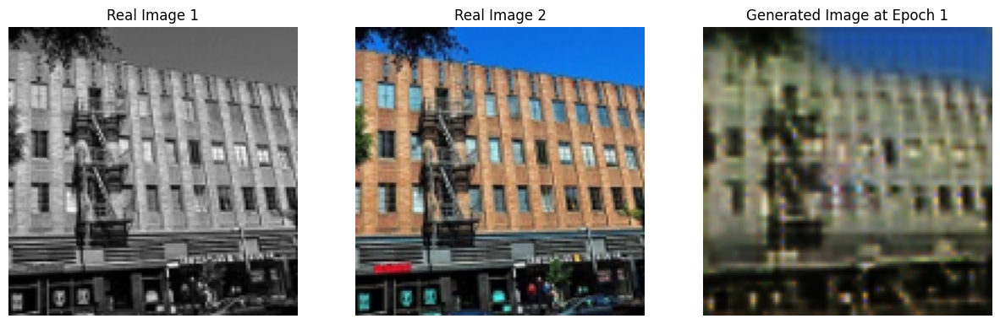

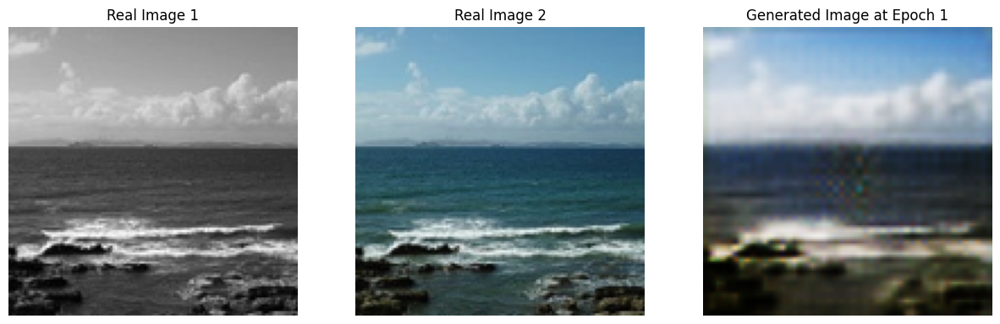

Epoch [2/101], d_loss: 0.7868, g_loss: 7.7285, val_loss: 7.9160
92.10792779922485
Epoch [3/101], d_loss: 0.9690, g_loss: 10.4960, val_loss: 7.7623
92.09020924568176
Epoch [4/101], d_loss: 0.7378, g_loss: 7.1568, val_loss: 7.8345
92.07876515388489
Epoch [5/101], d_loss: 0.6591, g_loss: 7.4637, val_loss: 7.7587
92.10262989997864


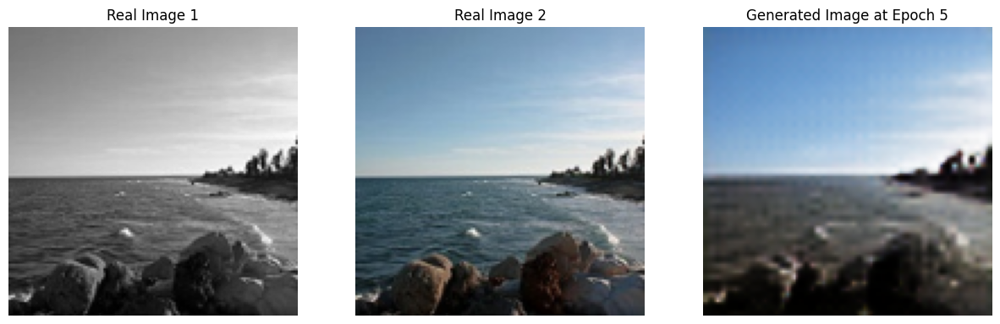

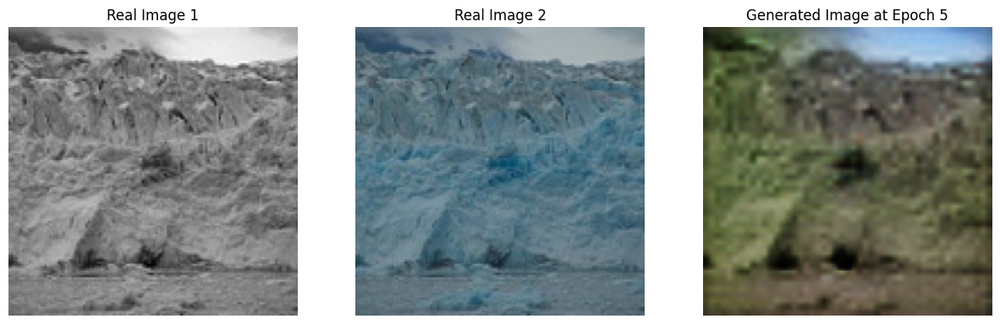

Epoch [6/101], d_loss: 1.3119, g_loss: 7.0123, val_loss: 7.5694
92.15413522720337
Epoch [7/101], d_loss: 0.6752, g_loss: 8.4415, val_loss: 7.6580
92.10635566711426
Epoch [8/101], d_loss: 0.6560, g_loss: 6.9920, val_loss: 7.5405
92.09696412086487
Epoch [9/101], d_loss: 0.6552, g_loss: 6.7205, val_loss: 7.5890
92.07810401916504
Epoch [10/101], d_loss: 0.6548, g_loss: 8.5695, val_loss: 7.5185
92.09957695007324


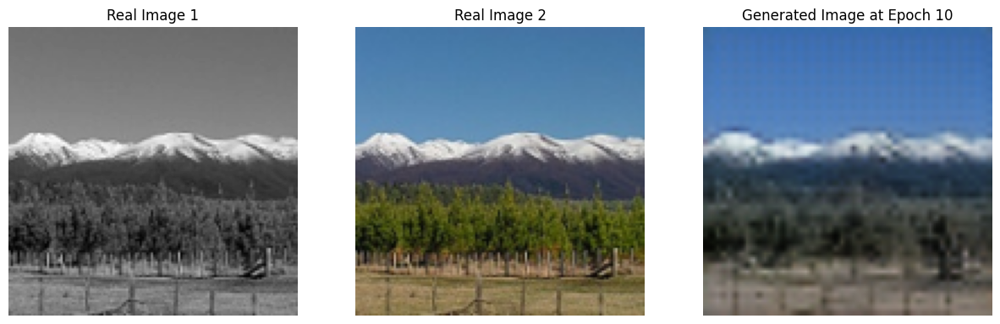

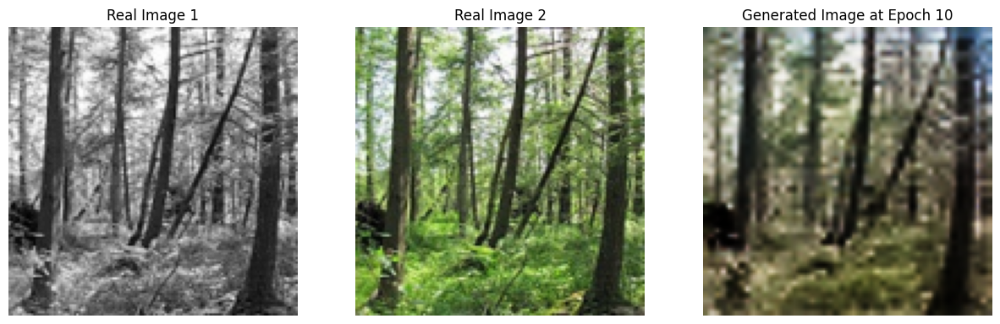

Epoch [11/101], d_loss: 0.6538, g_loss: 9.3837, val_loss: 7.3055
92.09880447387695
Epoch [12/101], d_loss: 0.6515, g_loss: 6.4740, val_loss: 7.3826
92.09912919998169
Epoch [13/101], d_loss: 0.6651, g_loss: 9.1129, val_loss: 7.5142
92.12246298789978
Epoch [14/101], d_loss: 0.6785, g_loss: 7.1650, val_loss: 7.3369
92.07806777954102
Epoch [15/101], d_loss: 0.6573, g_loss: 6.1553, val_loss: 7.6015
92.04213500022888


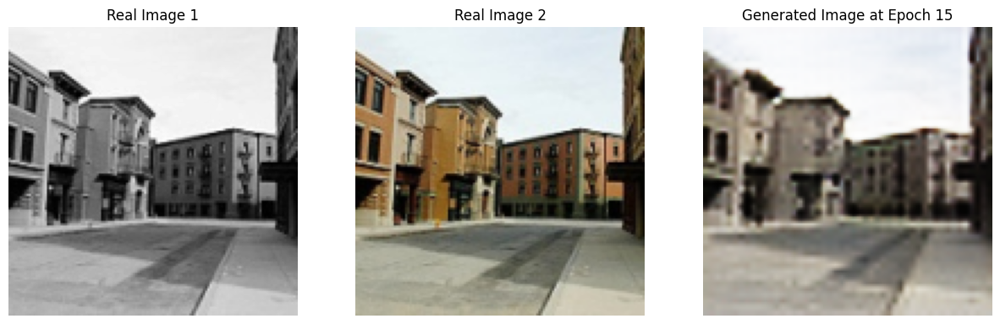

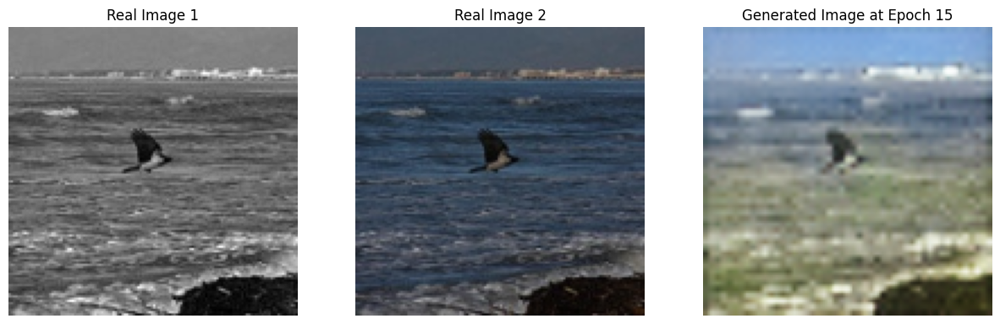

Epoch [16/101], d_loss: 0.6547, g_loss: 7.9792, val_loss: 7.3934
92.05303144454956
Epoch [17/101], d_loss: 0.6527, g_loss: 8.5134, val_loss: 7.3533
92.08369421958923
Epoch [18/101], d_loss: 0.6521, g_loss: 8.4679, val_loss: 7.3522
92.08529877662659
Epoch [19/101], d_loss: 0.6528, g_loss: 7.3134, val_loss: 7.4078
92.07864189147949
Epoch [20/101], d_loss: 0.6511, g_loss: 6.8026, val_loss: 7.2157
92.08228969573975


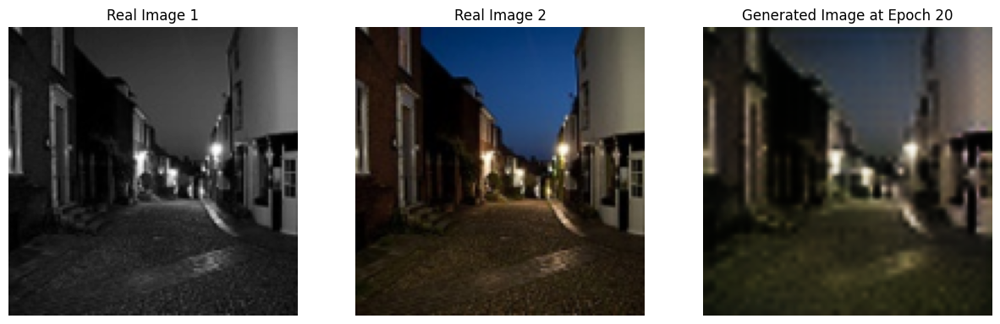

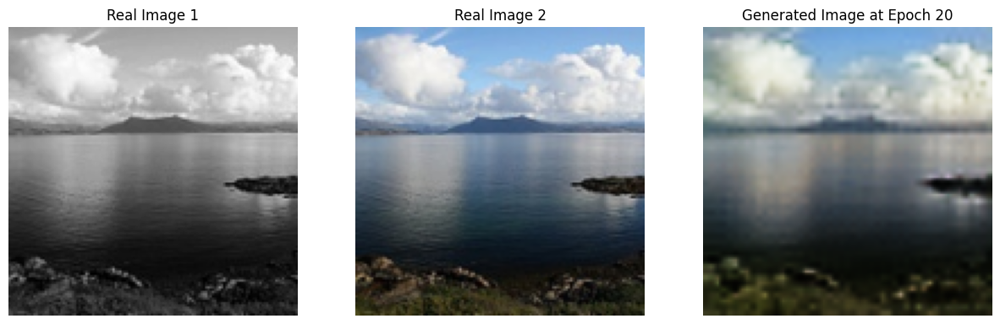

Epoch [21/101], d_loss: 0.6519, g_loss: 8.3283, val_loss: 7.2388
92.13962411880493
Epoch [22/101], d_loss: 0.6527, g_loss: 6.4892, val_loss: 7.3714
92.15674543380737
Epoch [23/101], d_loss: 0.6524, g_loss: 6.5890, val_loss: 7.5610
92.12323522567749
Epoch [24/101], d_loss: 0.6515, g_loss: 6.5095, val_loss: 7.3013
92.07771730422974
Epoch [25/101], d_loss: 0.6528, g_loss: 7.4054, val_loss: 7.3518
92.06441068649292


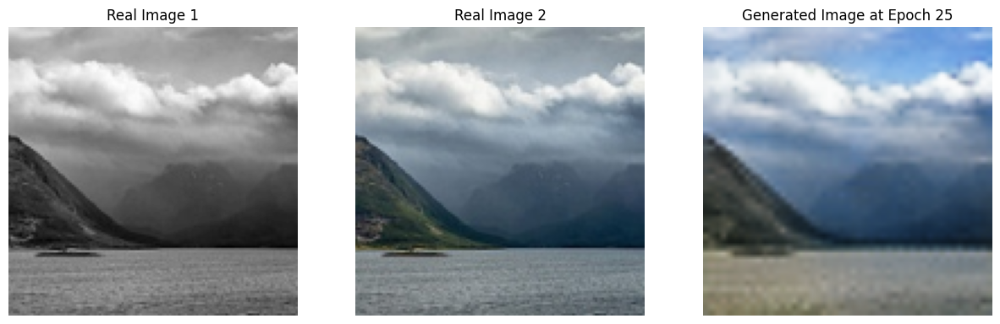

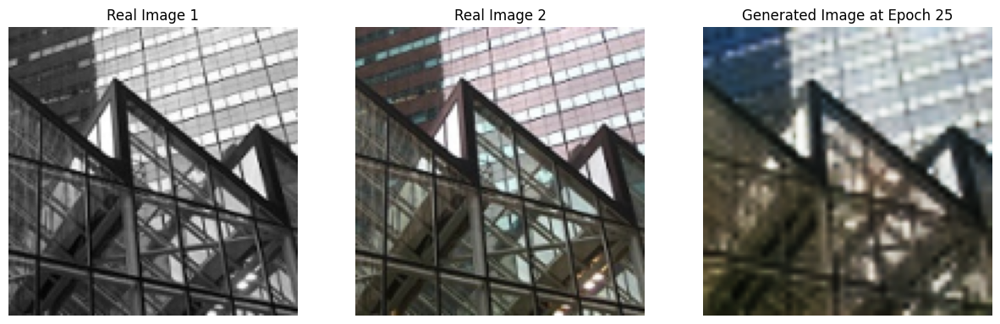

Epoch [26/101], d_loss: 0.6530, g_loss: 7.6242, val_loss: 7.4032
92.12780237197876
Epoch [27/101], d_loss: 0.6515, g_loss: 6.3398, val_loss: 7.2272
92.11034870147705
Epoch [28/101], d_loss: 0.6512, g_loss: 6.2210, val_loss: 7.2031
92.09908413887024
Epoch [29/101], d_loss: 0.6508, g_loss: 7.7470, val_loss: 7.1829
92.06461691856384
Epoch [30/101], d_loss: 0.6507, g_loss: 6.0558, val_loss: 7.1510
92.07766628265381


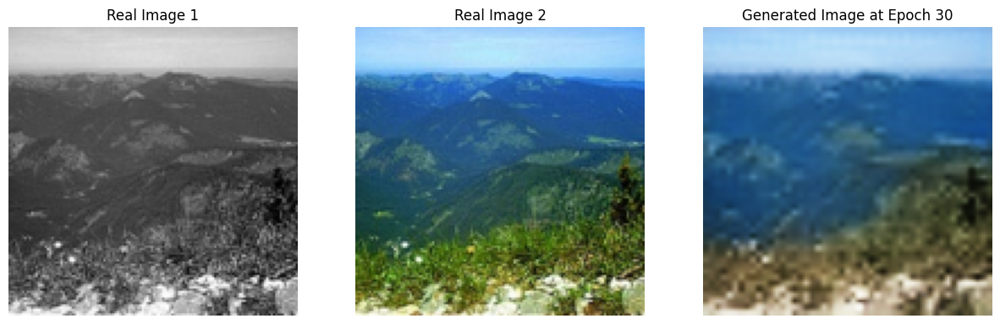

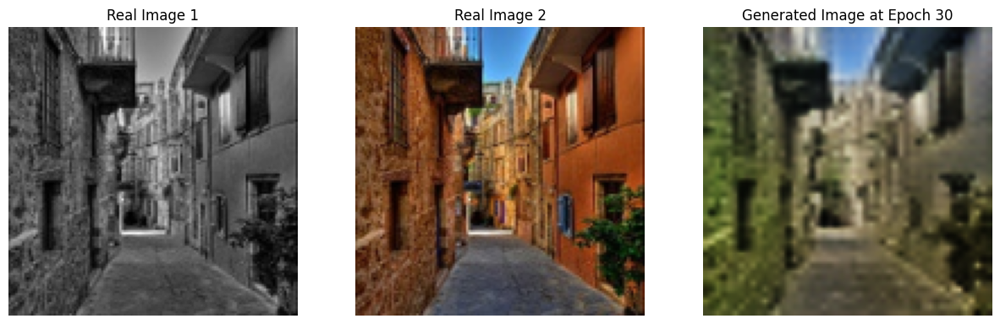

Epoch [31/101], d_loss: 0.6513, g_loss: 6.9803, val_loss: 7.1210
92.13366627693176
Epoch [32/101], d_loss: 0.6525, g_loss: 6.7081, val_loss: 7.2790
92.06761813163757
Epoch [33/101], d_loss: 0.6513, g_loss: 5.7835, val_loss: 7.1370
92.08887910842896
Epoch [34/101], d_loss: 0.6517, g_loss: 5.6223, val_loss: 7.1631
91.93099236488342
Epoch [35/101], d_loss: 0.6508, g_loss: 6.0837, val_loss: 7.3089
91.90959405899048


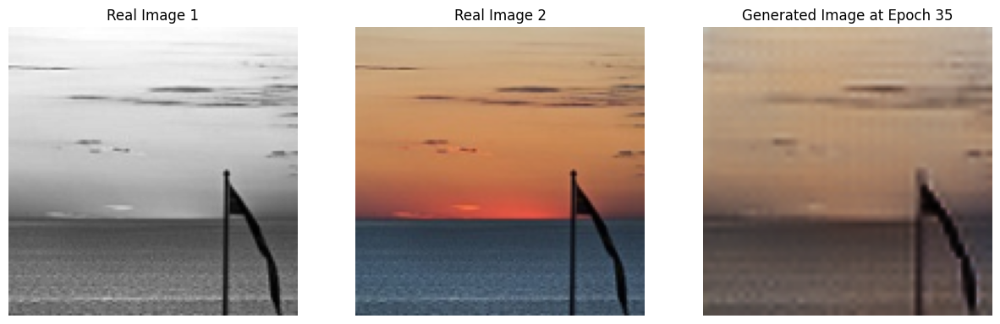

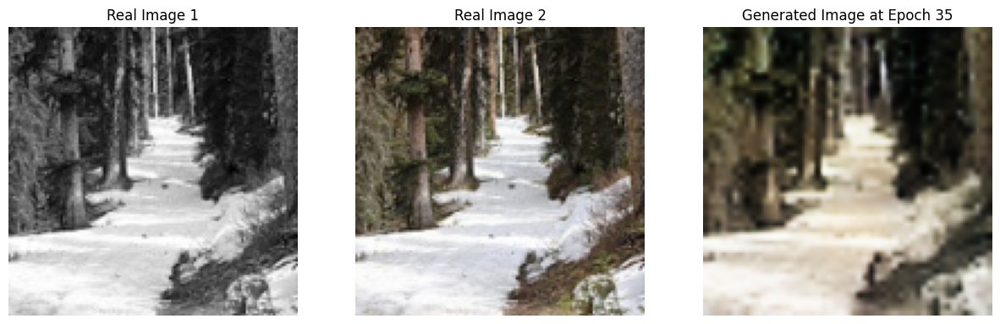

Epoch [36/101], d_loss: 0.6589, g_loss: 5.6896, val_loss: 7.0972
91.95384573936462
Epoch [37/101], d_loss: 0.6547, g_loss: 4.8089, val_loss: 7.2106
91.9416663646698
Epoch [38/101], d_loss: 0.6509, g_loss: 7.2889, val_loss: 7.3342
91.90884137153625
Epoch [39/101], d_loss: 0.6513, g_loss: 6.0259, val_loss: 7.1615
91.93414211273193
Epoch [40/101], d_loss: 0.9083, g_loss: 5.2747, val_loss: 6.8273
92.04305243492126


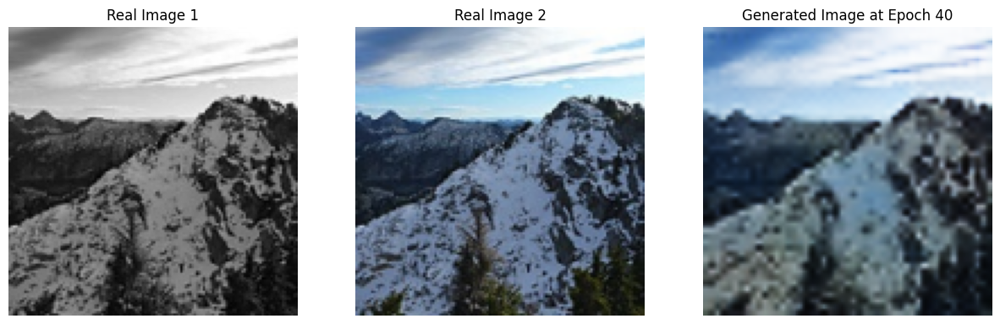

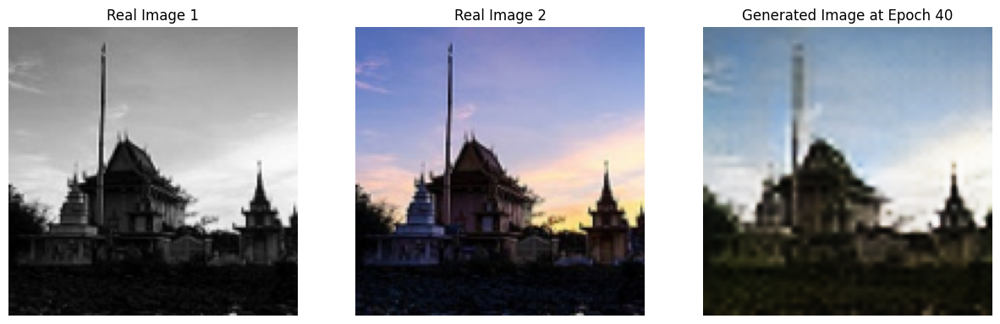

Epoch [41/101], d_loss: 0.7945, g_loss: 6.3312, val_loss: 7.0739
91.94845032691956
Epoch [42/101], d_loss: 0.9191, g_loss: 5.5201, val_loss: 6.9046
91.92939066886902
Epoch [43/101], d_loss: 0.6686, g_loss: 5.7739, val_loss: 7.2450
91.92661643028259
Epoch [44/101], d_loss: 0.6680, g_loss: 5.8401, val_loss: 7.0746
91.94026255607605
Epoch [45/101], d_loss: 0.6564, g_loss: 6.2716, val_loss: 7.1852
91.9633686542511


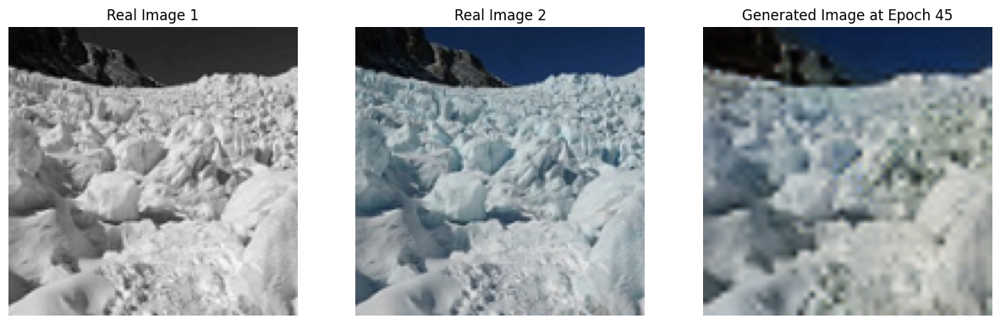

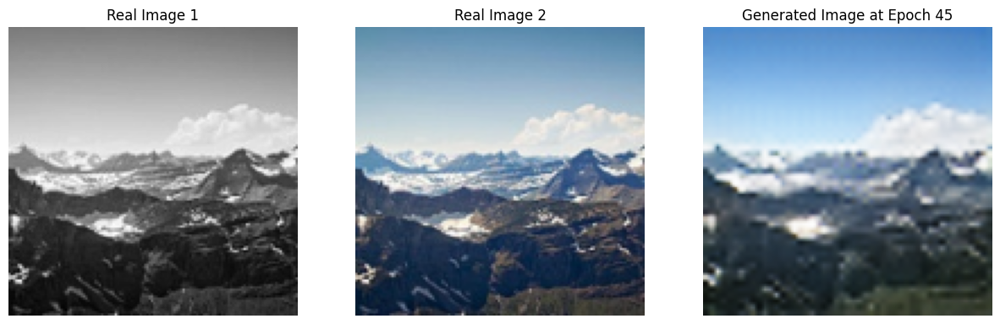

Epoch [46/101], d_loss: 0.6548, g_loss: 8.0031, val_loss: 7.3498
91.98387908935547
Epoch [47/101], d_loss: 0.6652, g_loss: 5.9856, val_loss: 7.1824
91.93894243240356
Epoch [48/101], d_loss: 0.6515, g_loss: 6.5594, val_loss: 7.1536
91.97388195991516
Epoch [49/101], d_loss: 0.6524, g_loss: 6.7882, val_loss: 7.2202
92.08315110206604
Epoch [50/101], d_loss: 0.6527, g_loss: 5.4022, val_loss: 7.0594
92.05877351760864


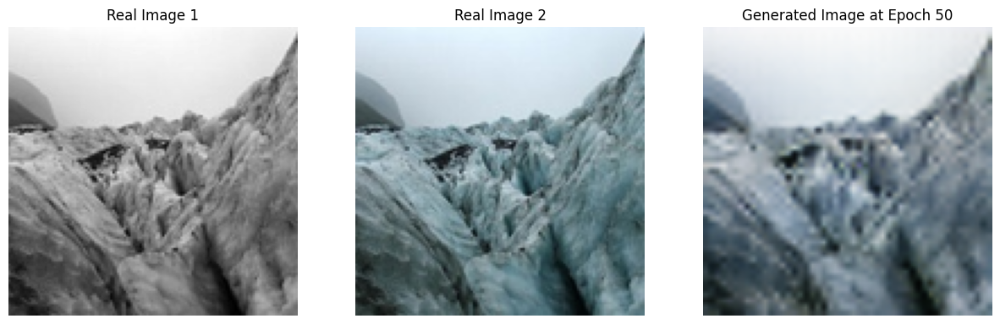

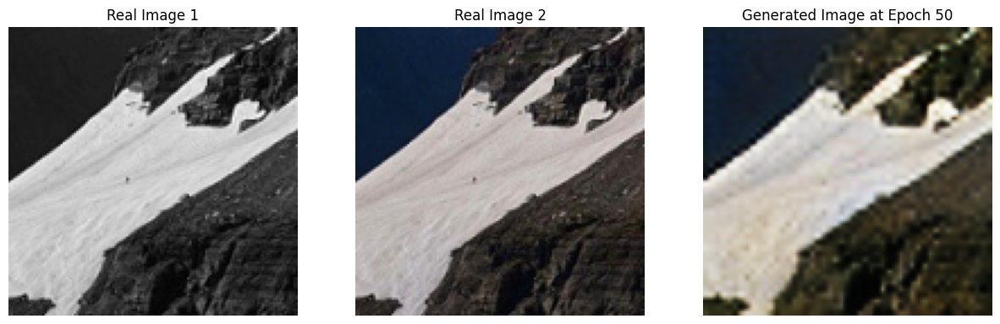

Epoch [51/101], d_loss: 0.6518, g_loss: 5.9460, val_loss: 7.2512
92.10494565963745
Epoch [52/101], d_loss: 0.6601, g_loss: 6.4751, val_loss: 7.1685
92.02647399902344
Epoch [53/101], d_loss: 0.6777, g_loss: 7.9903, val_loss: 7.2698
92.06557321548462
Epoch [54/101], d_loss: 0.6526, g_loss: 5.8592, val_loss: 7.5338
92.07157778739929
Epoch [55/101], d_loss: 0.6525, g_loss: 5.6041, val_loss: 7.0504
92.07891774177551


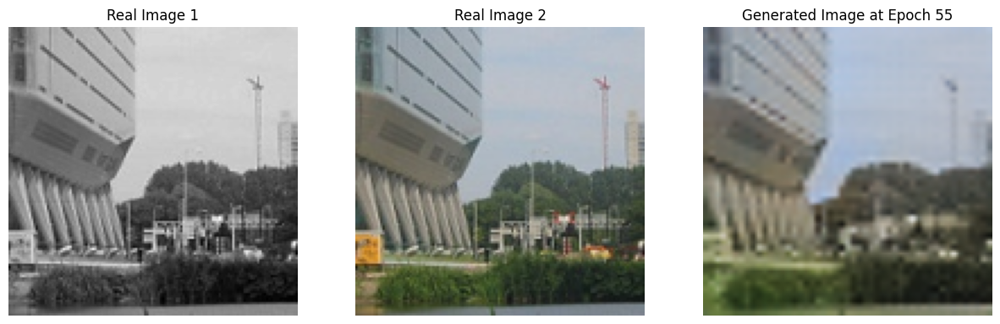

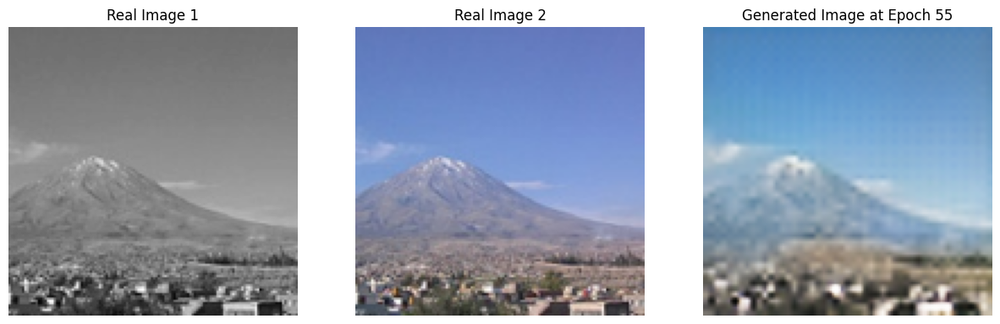

Epoch [56/101], d_loss: 0.6518, g_loss: 6.0773, val_loss: 7.0907
92.11639976501465
Epoch [57/101], d_loss: 0.6526, g_loss: 5.7546, val_loss: 7.2006
92.0829689502716
Epoch [58/101], d_loss: 0.6521, g_loss: 5.7489, val_loss: 7.0851
92.07432317733765
Epoch [59/101], d_loss: 0.6524, g_loss: 7.8332, val_loss: 7.2751
92.0394287109375
Epoch [60/101], d_loss: 0.6666, g_loss: 5.5620, val_loss: 7.1412
92.07552599906921


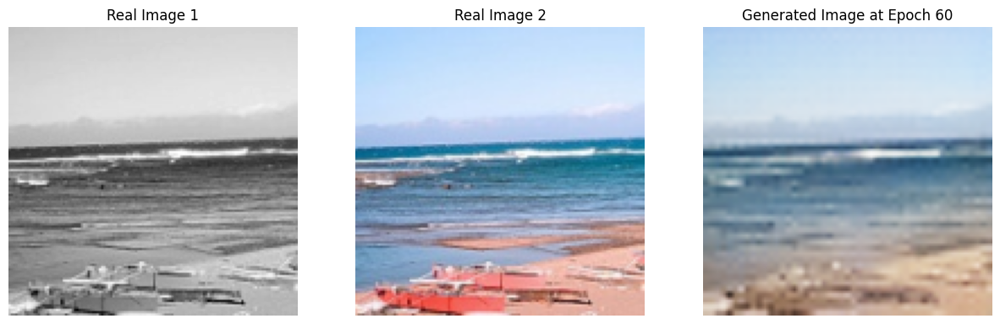

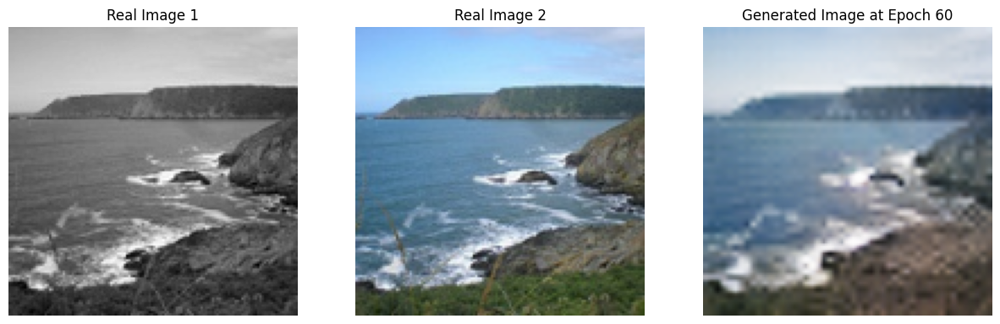

Epoch [61/101], d_loss: 0.6508, g_loss: 5.2644, val_loss: 7.1278
92.15336203575134
Epoch [62/101], d_loss: 0.6513, g_loss: 5.9175, val_loss: 6.9630
92.17116618156433
Epoch [63/101], d_loss: 0.6522, g_loss: 5.5095, val_loss: 7.1809
92.07643556594849
Epoch [64/101], d_loss: 0.6508, g_loss: 5.2663, val_loss: 7.2841
92.08826184272766
Epoch [65/101], d_loss: 0.6519, g_loss: 6.0293, val_loss: 7.0044
92.02969002723694


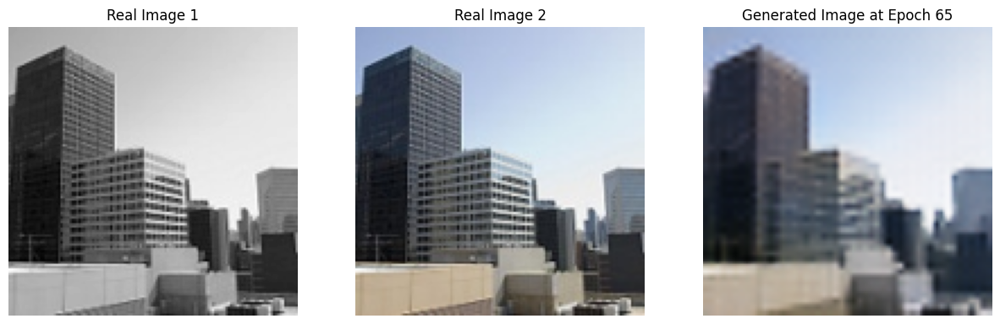

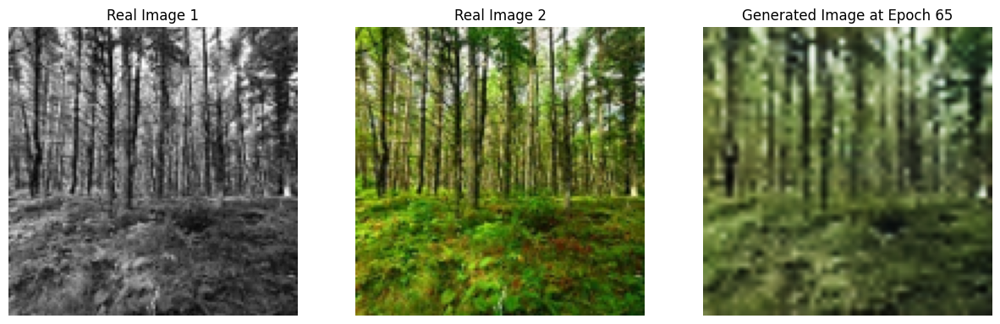

Epoch [66/101], d_loss: 0.6510, g_loss: 5.9054, val_loss: 7.0609
92.12280988693237
Epoch [67/101], d_loss: 0.6512, g_loss: 6.9136, val_loss: 7.0244
92.0899589061737
Epoch [68/101], d_loss: 0.6513, g_loss: 4.9059, val_loss: 6.9897
92.083163022995
Epoch [69/101], d_loss: 0.6509, g_loss: 5.8229, val_loss: 7.1125
92.0594470500946
Epoch [70/101], d_loss: 0.6513, g_loss: 6.4851, val_loss: 7.1002
92.08266520500183


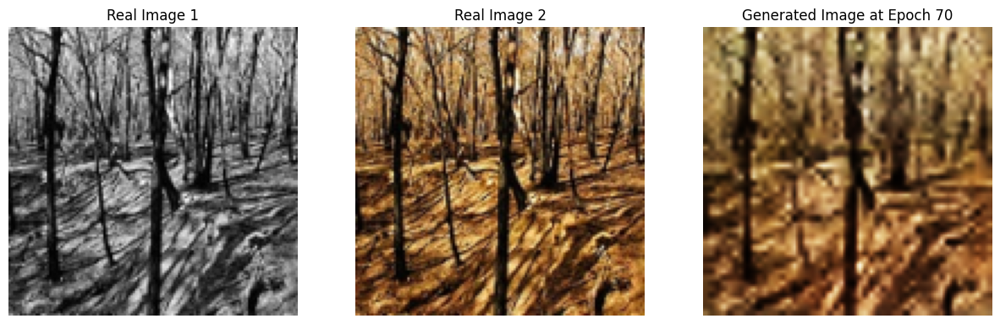

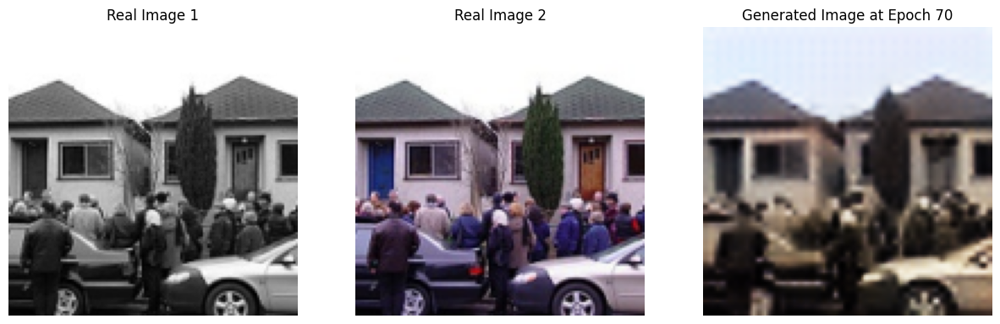

KeyboardInterrupt: 

In [20]:
from matplotlib import pyplot as plt

# Instanciando o modelo GAN
gan = PaisagemGAN(generator=gene, discriminator=disc)
gan = gan.to(device)
gan.compile(g_loss=g_loss, d_loss=d_loss)

# Número de épocas
num_epochs = 101


# Loop de treinamento
print("Iniciar treinamento")
g_losses = []
d_losses = []
val_losses = []
for epoch in range(num_epochs):
    i = 0
    inicio = time.time()
    train_g_loss = 0.0
    train_d_loss = 0.0
    for batch in train_loader:
        real_images = normalize(batch[1].to(device))
        grey_images = normalize(batch[0].to(device))
        loss = gan.train_step(real_images, grey_images)
        i += 1
        train_g_loss += loss['g_loss']
        train_d_loss += loss['d_loss']
        real_images.cpu()
        grey_images.cpu()
    g_losses.append(train_g_loss/len(train_loader))
    d_losses.append(train_d_loss/len(train_loader))
    
    # Avaliação no conjunto de validação
    val_loss = 0.0
    with torch.no_grad():
        for val_batch in val_loader:
            val_real_images = normalize(val_batch[1].to(device))
            val_grey_images = normalize(val_batch[0].to(device))
            val_fake_images = gan.generator(val_grey_images)
            val_yhat_fake = gan.discriminator(val_fake_images)
            last_v_loss = g_loss(val_yhat_fake, val_fake_images, val_real_images)
            val_loss += last_v_loss.item()
            val_real_images.cpu()
            val_grey_images.cpu()
    
    val_loss /= len(val_loader)
    val_losses.append(val_loss)
    
    print(f"Epoch [{epoch+1}/{num_epochs}], d_loss: {loss['d_loss']:.4f}, g_loss: {loss['g_loss']:.4f}, val_loss: {val_loss:.4f}")
    fim = time.time()
    print(fim - inicio)

    if (epoch+1) % 5 == 0 or (epoch) == 0:
        save_checkpoint(gan.generator, gan.g_opt, epoch, batch, loss, filepath='/kaggle/working/gen.pth')
        save_checkpoint(gan.discriminator, gan.d_opt, epoch, batch, loss, filepath='/kaggle/working/disc.pth')

        # Desenhando evoluçao do treinamento
        # Convertendo as imagens geradas de 0-1 para 0-255
        gen_image = (loss['gen'][0].detach().cpu().numpy().transpose(1, 2, 0) * 255).astype('uint8')

        # Convertendo batch[0] e batch[1] de 0-1 para 0-255
        real_image1 = (batch[0][0].detach().cpu().numpy().squeeze()*255).astype('uint8')
        real_image2 = (batch[1][0].detach().cpu().numpy().transpose(1, 2, 0)*255 ).astype('uint8')

        # Plotando as três imagens lado a lado
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].imshow(real_image1, cmap='gray')
        axes[0].set_title("Real Image 1")

        axes[1].imshow(real_image2)
        axes[1].set_title("Real Image 2")

        axes[2].imshow(gen_image)
        axes[2].set_title(f"Generated Image at Epoch {epoch + 1}")

        for ax in axes:
            ax.axis('off')  # Remove os eixos

        plt.show()

        # Desenhando evolução da validação
        # Convertendo as imagens geradas de 0-1 para 0-255
        gen_image = (val_fake_images[0].detach().cpu().numpy().transpose(1, 2, 0) * 255).astype('uint8')

        # Convertendo batch[0] e batch[1] de 0-1 para 0-255
        real_image1 = (val_grey_images[0].detach().cpu().numpy().squeeze()*255).astype('uint8')
        real_image2 = (val_real_images[0].detach().cpu().numpy().transpose(1, 2, 0)*255 ).astype('uint8')

        # Plotando as três imagens lado a lado
        fig, axes = plt.subplots(1, 3, figsize=(15, 5))

        axes[0].imshow(real_image1, cmap='gray')
        axes[0].set_title("Real Image 1")

        axes[1].imshow(real_image2)
        axes[1].set_title("Real Image 2")

        axes[2].imshow(gen_image)
        axes[2].set_title(f"Generated Image at Epoch {epoch + 1}")

        for ax in axes:
            ax.axis('off')

        plt.show()
        

print("Treinamento concluído!")


In [ ]:
#torch.cuda.empty_cache()
print(val_losses)

In [23]:
import csv

# Caminho do arquivo onde as perdas serão salvas
loss_file_path = '/kaggle/working/losses.csv'

# Função para salvar as perdas em um arquivo CSV
def save_losses_to_csv(g_losses, d_losses, val_losses, file_path):
    with open(file_path, mode='w', newline='') as file:
        writer = csv.writer(file)
        writer.writerow(['Epoch', 'G Loss', 'D Loss', 'Validation Loss'])
        for epoch, (g, d, val_loss) in enumerate(zip(g_losses, d_losses, val_losses), start=1):
            writer.writerow([epoch, g, d, val_loss])

# Salvar as perdas
save_losses_to_csv(g_losses, d_losses, val_losses, loss_file_path)

print(f"Losses saved to {loss_file_path}")

Losses saved to /kaggle/working/losses.csv


In [36]:
# Caminho para a pasta de teste
test_color_dir = "/kaggle/input/test-color"
test_gray_dir = "/kaggle/working/test_gray"
os.makedirs(test_gray_dir, exist_ok=True)

# Listar imagens de teste
test_color_images = sorted(os.listdir(test_color_dir))

# Função para converter e salvar imagens em escala de cinza
def convert_to_grayscale_and_save(image_path, save_dir):
    image = Image.open(image_path).convert("L")  # Converte para escala de cinza
    base_name = os.path.basename(image_path)
    save_path = os.path.join(save_dir, base_name)
    image.save(save_path)

# Converter e salvar todas as imagens coloridas como monocromáticas
for img_name in test_color_images:
    img_path = os.path.join(test_color_dir, img_name)
    convert_to_grayscale_and_save(img_path, test_gray_dir)

print("Imagens monocromáticas geradas e salvas com sucesso!")

Imagens monocromáticas geradas e salvas com sucesso!


In [44]:
import os
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
from torchvision import transforms

# Definir o dispositivo (GPU se disponível, caso contrário, CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Definir o dataset customizado que converte a imagem colorida para cinza diretamente
class CustomDataset(Dataset):
    def __init__(self, gray_dir, color_dir, image_names, transform=None):
        self.color_dir = color_dir
        self.image_names = image_names
        self.transform = transform

    def __len__(self):
        return len(self.image_names)

    def __getitem__(self, idx):
        image_name = self.image_names[idx]
        # Caminho para a imagem colorida
        color_image_path = os.path.join(self.color_dir, image_name + '.jpeg')

        # Carregar a imagem colorida e convertê-la para cinza
        color_image = Image.open(color_image_path).convert('RGB')
        gray_image = color_image.convert('L')  # Converte para escala de cinza

        # Aplicar as transformações
        if self.transform:
            gray_image = self.transform(gray_image)
            color_image = self.transform(color_image)

        return gray_image, color_image

# Definir as transformações de pré-processamento (depende do que você usou no treinamento)
transform = transforms.Compose([
    transforms.Resize((128, 128)),  # Tamanho da imagem esperado
    transforms.ToTensor(),  # Converte a imagem para tensor
])

# Caminho para a pasta de teste
test_color_dir = "/kaggle/input/test-color"

# Listar imagens de teste
test_color_images = sorted(os.listdir(test_color_dir))

# Extraindo nomes dos arquivos (sem a extensão)
test_image_names = [os.path.splitext(img)[0] for img in test_color_images]

# Criando dataset de teste
test_dataset = CustomDataset(None, test_color_dir, test_image_names, transform=transform)

# Criando DataLoader de teste
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False, num_workers=4, pin_memory=True)

# Mover o gerador para o dispositivo (GPU ou CPU)
generator = generator.to(device)

# Colocar o gerador no modo de avaliação (para desativar dropout e batchnorm)
generator.eval()

# Gerar novas imagens com o gerador
for gray_image, color_image in test_loader:
    # Mover a imagem em escala de cinza para o dispositivo (GPU ou CPU)
    gray_image = gray_image.to(device)

    with torch.no_grad():  # Desativa o cálculo do gradiente para a inferência
        generated_image = generator(gray_image)

    # Pós-processamento (se necessário)
    generated_image = generated_image.squeeze(0)  # Remove a dimensão de lote
    generated_image = (generated_image * 0.5) + 0.5  # Desfaz a normalização [-1, 1] -> [0, 1]
    generated_image = transforms.ToPILImage()(generated_image.cpu())  # Converte para PIL image

    # Salvar ou exibir a nova imagem gerada
    image_name = test_image_names.pop(0)
    generated_image.save(f'/kaggle/working/generated_{image_name}.jpeg')
    generated_image.show()


IndexError: tuple index out of range